In [1]:
from random import randrange
import numpy as np 
import matplotlib.pyplot as plt
from numba import njit

In [20]:
@njit
def position_sort(sites):

    return sites[sites[:, 1].argsort()]

@njit
def check_target_site(sites, target_site):

    
    # if we found the site here then it is occupied -> returning False
    return not target_site in sites[:,1]




@njit
def arrange_sites():

    
    dtype = [("velocity", int),("position", int)]
    # get initial sites where cars are placed
    sites = np.random.choice(Size, Cars, replace=False)
    # for every car put it in a tuple and give it velocity
    vel = np.random.choice(V_MAX,Cars)
    vel_sites  = np.column_stack((vel,sites))
    return position_sort(vel_sites)
    
    #return position_sort(sites, velocities)
    #eturn np.array(sites)
    #return position_sort(sites)

@njit
def distance_to_front(sites, present):
    # Check the distance to the car in front
    # double index at the end because np.where gives a wierd output style (two 2d arrays)
    car_index =  np.where(sites[:,1] == present[1])[0][0]
    car_in_front_index = car_index + 1 % sites.shape[0]
    car_in_front = sites[car_in_front_index]
    #print(car_index,car_in_front_index,car_in_front)

    d = car_in_front[1] - present[1]
    
    # On a circular road, when the car is at the end of the road and the car in front is at the beginning
    #of the road, the distance will be less than 0
    if (d < 0):
        d = Size + d
        
    return d


@njit
def update_rules(car, sites): 
    # Update vehicle velocity
    v = car[0] 
    site = car[1]
    
    # 1. Acceleration
    # When the speed of the vehicle is less than V_MAX and
    # the position after the move is not currently occupied by a vehicle
    if v < V_MAX and check_target_site(sites, site + v + 1): 
        v=v+1
        
    # 2. Deceleration
    # When the distance to the vehicle in front is less than the speed of the vehicle ,
    # the vehicle needs to slow down.
    d = distance_to_front(sites,car)
    
    # Slow down to distance minus one
    if d <= v:
        v=d-1
        
    # 3. Ranomization
    # Vehicles may be randomly slowed down by 1
    
    if v > 0:
        p = np.random.randint(1,101)
        if p <= P:
            v=v-1
            
    # 4. Movement
    new_site = site + v
    
    return v, new_site

#@njit
def simulation(pre_iter , this_iter):
    z = zip(pre_iter , this_iter) 
    
    Simulated_sites = ["."]*Size
    
    for pre_site , this_site in z: 
        site = pre_site [1]
        
        if site >= Size:
            site = site % Size
            
        velocity = this_site [0]
        
        Simulated_sites[site] = str(velocity)
        
    print("".join(Simulated_sites))
    return Simulated_sites



#@njit
def compute_density(cars, size):
    # Calculation of traffic density 
    return cars/size
        
#@njit   
def pass_or_not(count_point , sites):
    # If there is no vehicle at the count point
    if sites[count_point] is str("."):
        for i in list(range(count_point - V_MAX, count_point))[::-1]:
            if sites[i] is not str(".") and int(sites[i]) > (count_point -i):
                return 1
            
        return 0
    
    # If there is a vehicle at the count point and the velocity is greater than 0.
    elif int(sites[count_point]) > 0:
        return 1
    
    else:
        return 0
    

        

In [43]:
Iteration = 30 
Size = 100 
Cars = 40
P = 10 
V_MAX = 5




In [60]:
initial_settings = arrange_sites() 
pre_iter = initial_settings

for i in range(Iteration):
    this_iter = np.array(list(update_rules(car, pre_iter) for car in pre_iter))
    sites = simulation(pre_iter , this_iter)
    pre_iter = this_iter

..001..01.2..3...1.02..03.............03.......2.....4.......2...4......003....1.0000...2....1.2..1.
..01.1.1.2..3...0.01..01...4..........1...4......3.......5.....3.....2..01...2..00000.....3...2..1.2
.31.1.1.2..3...00.1.1.0.2......5.......2......5.....4.........2...4....01.2....000001........2..1.2.
3..141.2..3...001..1.01...3.........4....3.........4....5.......3.....01.2..2..00001.2.........0.2..
...41.2.53...001.2..01.2.....4..........3...4..........5.....5.....2..1.2..2..00001.2..2.......1...3
..4..2.53...051.2..01.2..2.......5.........4....5...........5.....2..1.2..2..00001.2..2..3......2...
......53...051.2..51.2..2..3..........5........5.....5...........2..1.2..2..00001.1..2..3...4.....3.
.4........051.2..51.2..5..3...4............5........4.....5........1.2..2..00001.1.2...3...4....3...
.....5....01.2..51.1..5..3..53....5.............4.......5......4....2..1..00000.1.2..3....4....3...4
...5......4.2..01.1.25..3..52...45.....5............5........5.....2..1.1.00001..2..3...4..

In [17]:
Iteration = 100 
Size = 10**4 
#Cars = 30
P = 50 
V_MAX = 5


Cars_list = list(range(2,Size)) 
density_list =[]
flow_list =[]

count_point_1 = randrange(0,Size)
count_point_2 = randrange(0,Size)

for Cars in Cars_list:
    initial_settings = arrange_sites()
    pre_iter = initial_settings 
    
    counts_1 = 0
    counts_2 = 0
    for i in range(Iteration):
        this_iter = list(update_rules(car, pre_iter) for car in pre_iter)
        sites = simulation(pre_iter , this_iter) 
        counts_1 += pass_or_not(count_point_1 , sites)
        counts_2 += pass_or_not(count_point_2 , sites) 
        
        pre_iter = this_iter
        
    density = compute_density(Cars, Size) 
    flow = (counts_1+counts_2)/(Iteration*2) 
        
    #print(density , flow)
    density_list.append(density) 
    flow_list.append(flow)
    
    
name1 = 'densitySize' + str(Size) + 'Iter' + str(Iteration) +'P05' + '.txt'
np.savetxt(name1, density_list)

name2 = 'flowSize' + str(Size) + 'Iter' + str(Iteration) +'P05' + '.txt'
np.savetxt(name2, flow_list)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



..................................................................................................................................................5......................................................................................5............................................................................................................................................................................5...........................................................................................................................................................................................................................4......................................................................................5..............................................................................................4.................................................................................................................................................5.............................................

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



.....................................................................................................................................................................................5..........................................................................................................................................................................4.................................................................................................................................................................................................................................................................................................................................................................................................................................................................5..............................................................................5......................................................................................................................

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



................................................................................................................................................................................5...........................................................................4................................................................................4..................................................5..........................4.......................................................................................................4..................................................................................................................................................................................................................................................................................................................................4.................................................................................................................................................................

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



...............................................................................................................................5.....................................................................4..........................................................................................................................5................................................................4............................4..........................4......................................................5........................................4....................................................4.................................................................4..............4...........................................................................................5.............................................................................................4..........................................................................................................................4...................

....................5..........................................................................5......................................................................................................................................................................................5..........5..............................................4.....................5.................................5...........................................................................5...........................................................4.........................4.................................................................................................................................................................................................................................................................................................................5....................4................5.....................................................................................................

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



.............5........................................................................................................................................5........................................................................5................4......................................................................................................5........................................................................................................5..................................................................................................................................................................................................................................................................................................................................................................................................4..............................................4.........................................................................................................5...........

.........................................................................................................................................................................................................................5...........................................................................................................4......................................................5...................................................................................4.......................................................................................................4...................................................................4..................4....................................................................................................................................................................................5..................................................................................................4................................4...............................

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



...................................................5..................................................................................................................................................................................................................................................................................................................................................................4.......................................................................4..............................................................4.....................................................................................................................................................................................4....................................................................................................................................................................................................................................................................................

......................................................4..........................5........................................................................................................................................................................................................................4......................................................................................................................................4..........................................................................................................................................4....................................................................................................3......5............5...............................................................5.............................................................................................................................................................................5.......................4.....................5......................

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



.........................................4.............4..........................................................................................5.........................5........................................................................................................................................................................................4.................5.......................................................................................................................................................................................................5.............................................................4...................................................4.....................................5.................................4........5................................................5........................................................4...........................................................4...............................................................

.......................................................................................4...........................................................................................................................................................................................................4......................................................................................................................................................................................................4.............................................................................................................................................................................................................................4...........................5..........5.................................................................5...........5.....................4.............4................4............................................................................5........................................

...............5....................................................................................................5....................................................................................................................................................................................................................................................................................4...............................................................................................................................5................4............................................................................................................................................................................................................................4..................................5.............................................................................4.................................................................................................4........................5....

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



.....................5.................................................................................4...........................................5......................5..................................................................................................................................................................5..............5............................................................................................................................4..........................5...........................................................................................4..................4....................5............................................................................................................5.............................................5...............................................................4........................................................2....3.....4................................................................................

............5.......................5....................5..............................5......................4....................................................................................................4....................................................................................................5....................................................................................4.........................................4..........................5................................................................................................................................................................5................4.......................................................................................................................4...................................5......................................................................................4............5........................4.........................................................................

4................................................4................................................................................................................................................................................................................................................................4................4.........................................................5....................................................4.............................................................................................................4........5....................................4...............4............4................................................................................................................4.......................................4.....5...........5..................................................4..............................................................................................................................................................

............................5.....................................................................................................5...............4......4.....................5.........5.....................................................................................................................................................................5..............................................................................................................................5..........................................................................................................4........5...............................................................4........................................................................................................5..........5.................4..............................................................5................................................................5..........4....................................5...............................

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



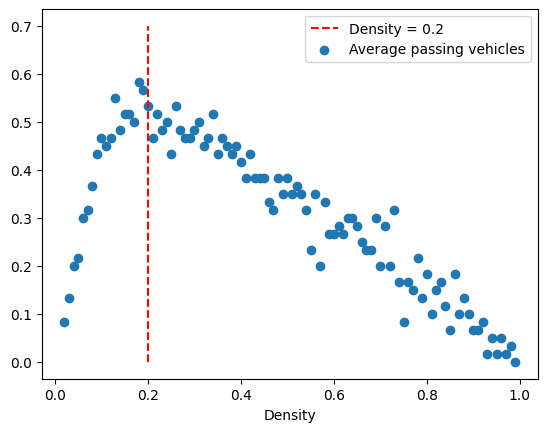

In [8]:
plt.xlabel("Density")
plt.vlines([0.2], 0,0.7, linestyles='dashed', colors='red',label = 'Density = 0.2')
plt.scatter(density_list , flow_list , label = 'Average passing vehicles')
plt.legend()
plt.show()